In [0]:
!git clone https://github.com/hflabs/city

fatal: destination path 'city' already exists and is not an empty directory.


In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from math import radians, cos, sin, asin, sqrt
from matplotlib.animation import FuncAnimation
from matplotlib import rc #rc is used for colab animation display
from IPython.display import HTML
import time

In [0]:
data = pd.read_csv('city/city.csv')

# Preprocessing
# dropping uninterpretable population values
for index, row in data.iterrows():
  population = row["population"]
  try:
    int(population)
  except:
    data = data.drop(index=index)

data[['population']] = pd.to_numeric(data['population'])
data = data.sort_values("population",ascending=False)
data = data.head(30)
print(data['population'])

509     11514330
786      4848742
647      1498921
832      1377738
619      1250615
927      1216965
782      1164900
656      1154000
1064     1130273
757      1091544
62       1062300
121      1021244
706      1000679
411       973826
159       889680
801       836900
381       744933
784       719484
4         635585
999       628117
1008      613793
717       592069
1116      591486
223       587225
995       581758
177       577990
1015      577668
666       570329
322       547885
316       532884
Name: population, dtype: int64


In [0]:
#Distance between two latitude longtitude pairs of GPS coordinates (Haversine Formula)
def distance(lat1,long1,lat2,long2):
    lat1,long1,lat2,long2 = map(radians, [lat1,long1,lat2,long2])

    dlong = long2 - long1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlong/2)**2
    c = 2 * asin(sqrt(a))

    return 6371* c

# Route distance calculation
# points: array of longtitude latitude tuples
def route_distance(points):
  dist = 0
  for i in range(len(points)-1):
    p1 = points[i]
    p2 = points[i+1]
    dist+=distance(p1[0],p1[1],p2[0],p2[1])
  return dist

def p_star(route,T):
  return np.exp(-route_distance(route)/T)

In [0]:
#Taking out city names and their coordinates
names = np.array(data[["address"]].values.tolist())
coords = data[["geo_lat","geo_lon"]].to_numpy()
print(names[:,0])
print(coords)

['г Москва' 'г Санкт-Петербург' 'г Новосибирск' 'г Екатеринбург'
 'г Нижний Новгород' 'г Казань' 'г Самара' 'г Омск' 'г Челябинск'
 'г Ростов-на-Дону' 'г Уфа' 'г Волгоград' 'г Пермь' 'г Красноярск'
 'г Воронеж' 'г Саратов' 'г Краснодар' 'Самарская обл, г Тольятти'
 'г Барнаул' 'г Ижевск' 'г Ульяновск' 'г Владивосток' 'г Ярославль'
 'г Иркутск' 'Тюменская обл, г Тюмень' 'г Махачкала' 'г Хабаровск'
 'г Оренбург' 'Кемеровская область - Кузбасс, г Новокузнецк' 'г Кемерово']
[[ 55.7540471  37.620405 ]
 [ 59.9391313  30.3159004]
 [ 55.028191   82.9211489]
 [ 56.8385216  60.6054911]
 [ 56.3240627  44.0053913]
 [ 55.7943584  49.1114975]
 [ 53.1950306  50.1069518]
 [ 54.9848566  73.3674517]
 [ 55.1602624  61.4008078]
 [ 47.2224566  39.718803 ]
 [ 54.734944   55.9578468]
 [ 48.7070042  44.5170339]
 [ 58.0102583  56.2342034]
 [ 56.0093879  92.8524806]
 [ 51.6593332  39.1969229]
 [ 51.5303047  45.9529348]
 [ 45.0401604  38.9759647]
 [ 53.5205348  49.3894028]
 [ 53.3479968  83.7798064]
 [ 56.852738

In [0]:
def optimize_sa_routes(k_max = 5000,annealing_rate = 0.95,decay_freq = 10, min_T = 0.1):
  #Setting up initial random route
  route_idxs = np.random.choice(np.arange(30), 30, replace=False)
  route = coords[route_idxs]

  T = route_distance(route)

  distances = []
  index_history = []

  start = time.time()
  for k in range(k_max):
    #Select two random points in the graph and change their places in route
    swap_idxs = np.random.choice(np.arange(30),2,replace=False)
    new_route_idxs = route_idxs.copy()
    new_route_idxs[[swap_idxs[0],swap_idxs[1]]] = new_route_idxs[[swap_idxs[1],swap_idxs[0]]]
    new_route = coords[new_route_idxs]
    
    # Saving routes for visualization
    index_history.append(route_idxs)

    current_dist = route_distance(route)
    new_dist = route_distance(new_route)

    distances.append(current_dist)

    #Evaluate p* values for both models and sample value from uniform distribution 
    p_current = p_star(route,T)
    p_neighbour = p_star(new_route,T)

    alpha = p_neighbour/p_current
    uniform_sample = np.random.uniform(size=1)

    # Update current model weights with neighbour's weights in case if the results improved
    # or if not do so with probability alpha
    if uniform_sample<=alpha or current_dist>new_dist:
      route = new_route
      route_idxs = new_route_idxs
    
    # Print training parameters
    if k%100==0:
      print("K {},Distance current:{} neighbour:{}, p_current {}, p_neighbour {}, alpha {}".format(k,current_dist,new_dist,p_current, p_neighbour, alpha))

    # Update temperature every decay_freq iterations
    if k%decay_freq==0:
      T=T*annealing_rate

    # Terminate training process if T value exceeded min_T
    if T<min_T:
      break
  end = time.time()
  print("Time passed {} seconds".format(end-start))

  # Print reults
  plt.ylabel('distance (km)')
  plt.xlabel('iteration')
  plt.suptitle('Annealing rate {}. Optimized distance {} km'.format(annealing_rate,current_dist))
  plt.plot(distances)
  return route_idxs, index_history

# Plots given route which is an array of coordinate pairs
def plot_route(indexes):
  route = coords[indexes]
  #Plot optimal route
  fig, ax = plt.subplots()
  ax.scatter(route[:,0], route[:,1])
  ax.plot(route[:,0], route[:,1],'-o')
  fig.set_size_inches(18.5, 10.5)
  for i, txt in enumerate(names[indexes]):
      ax.annotate(txt[0], (coords[i,0], coords[i,1]))
  plt.show()

# Shows animated optimization process using an array of routes
def animate_route(history,frames=100):
  fig, ax = plt.subplots()
  ln, = plt.plot([], [], '-o', animated=True)

  def init():
      ax.scatter(coords[:,0], coords[:,1])    
      fig.set_size_inches(10, 5)
      for i, txt in enumerate(names):
          ax.annotate(txt[0], (coords[i,0], coords[i,1]))

      current_route = coords[history[0]]
      ax.plot(current_route[:,0], current_route[:,1],'-o')
      return ln,

  def update(frame):
      current_route = coords[history[frame*int(len(history)/(frames))]]
      ax.clear()
      for i, txt in enumerate(names):
          ax.annotate(txt[0], (coords[i,0], coords[i,1]))
      ax.plot(current_route[:,0], current_route[:,1],'-o')
      return ln,


  ani = FuncAnimation(fig, update, frames=frames,
                      init_func=init, blit=False, interval=100)

  rc('animation', html='jshtml')
  return ani

K 0,Distance current:63474.44669234213 neighbour:64275.20672375764, p_current 0.36787944117144233, p_neighbour 0.36326762011938507, alpha 0.9874637706380879
K 100,Distance current:51515.537181981636 neighbour:51281.12424142423, p_current 3.326983139354128e-13, p_neighbour 3.791660524376918e-13, alpha 1.139669293639101
K 200,Distance current:29622.918343099675 neighbour:29767.09850987547, p_current 9.751151976171354e-255, p_neighbour 5.65897997898975e-256, alpha 0.05803396350316822
K 300,Distance current:26810.002838060103 neighbour:26815.46376923268, p_current 0.0, p_neighbour 0.0, alpha nan
Time passed 0.14388823509216309 seconds


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in double_scalars


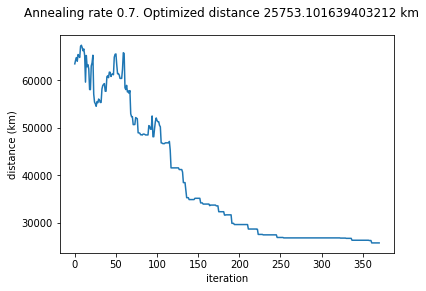

In [0]:
indexes, history = optimize_sa_routes(k_max = 5000,annealing_rate = 0.7,decay_freq = 10)

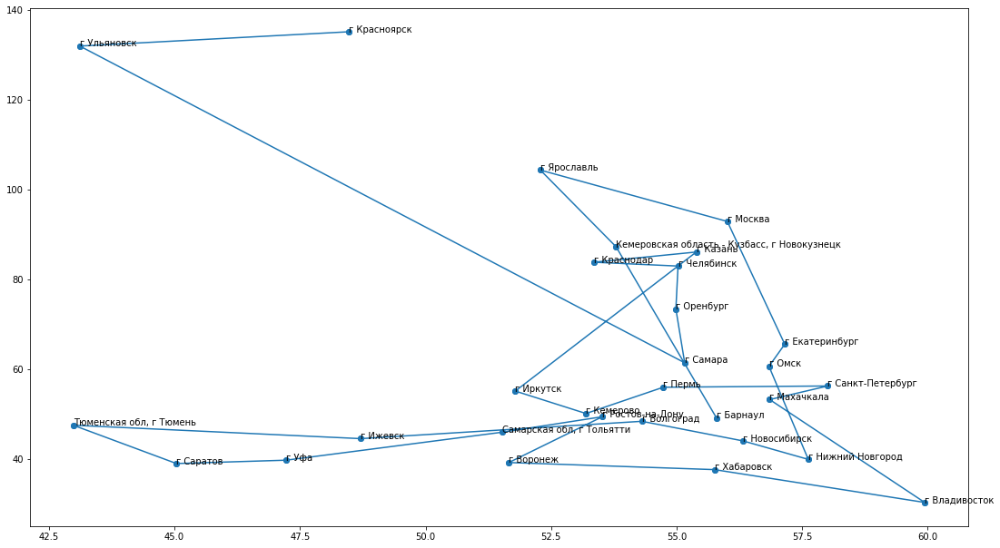

In [0]:
plot_route(indexes)

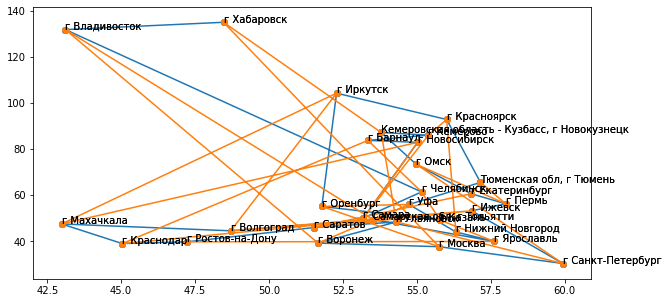

In [0]:
animation = animate_route(history)
animation